<a href="https://colab.research.google.com/github/oedjab/PVCK_smster3/blob/main/praktek_teori_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Masukkan nilai gamma : 9


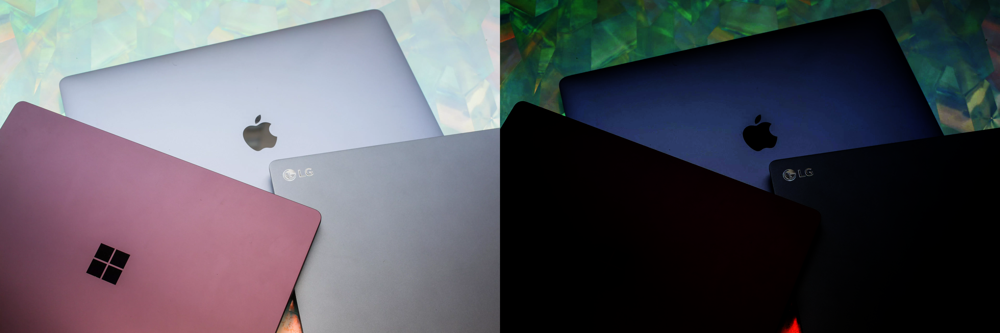

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# Membaca gambar
original = cv.imread('/content/drive/MyDrive/PCVK/Images/laptop.jpg')

# Cek apakah gambar berhasil dimuat
if original is None:
    print("Error: Gambar tidak ditemukan atau gagal dimuat.")
    exit()

# Input nilai gamma dari pengguna
gamma = float(input("Masukkan nilai gamma : "))

# Terapkan gamma correction dengan formula I = 255 * (I/255)^gamma
gamma_corrected = 255 * ((original / 255) ** gamma)

# Konversi kembali ke uint8
gamma_corrected = np.clip(gamma_corrected, 0, 255).astype(np.uint8)

# Menampilkan gambar asli dan hasil gamma correction berdampingan
combined_image = cv.hconcat([original, gamma_corrected])
cv2_imshow(combined_image)


 Image Depth Reduction 
----------------------
Masukkan bit depth (1-8): 1


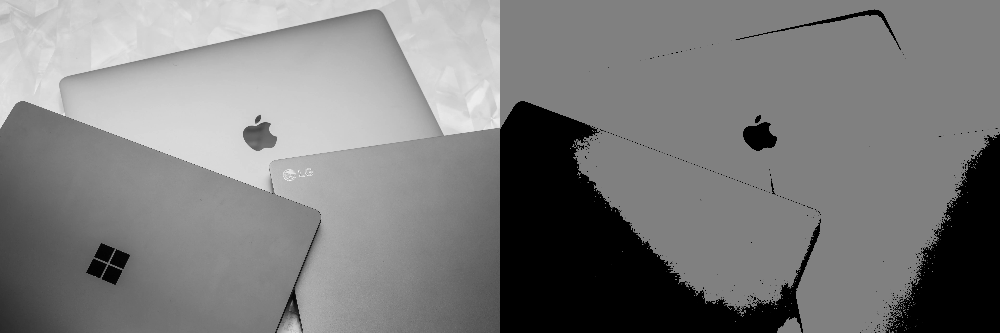

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Image Depth Reduction ')
print('----------------------')

# Membaca gambar dalam mode warna (grayscale atau RGB)
img = cv.imread('/content/drive/MyDrive/PCVK/Images/laptop.jpg', cv.IMREAD_GRAYSCALE)

# Cek apakah gambar berhasil dimuat
if img is None:
    print("Error: Gambar tidak ditemukan atau gagal dimuat.")
    exit()

try:
    bit_depth = int(input('Masukkan bit depth (1-8): '))
    if bit_depth < 1 or bit_depth > 8:
        print('Error: Bit depth harus antara 1 hingga 8.')
        exit()
except ValueError:
    print('Error: Input harus berupa angka.')
    exit()

# Menghitung level warna baru
levels = 2 ** bit_depth
factor = 256 // levels

# Reduksi bit depth menggunakan operasi vektor NumPy
depth_image = (img // factor) * factor

# Menampilkan gambar asli dan hasil reduksi bit depth berdampingan
final_frame = cv.hconcat([img, depth_image])
cv2_imshow(final_frame)


Masukkan jumlah gambar: 60
Nilai PSNR adalah 27.42223360665829 (dB)


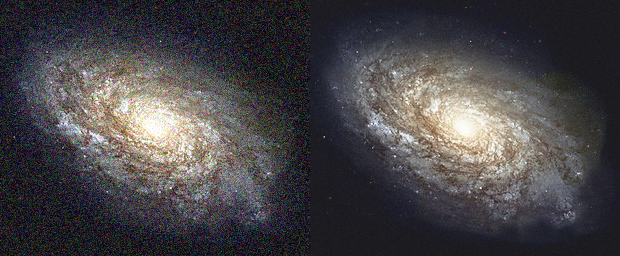

In [ ]:
import cv2
import numpy as np
from math import log10, sqrt
import glob
from google.colab.patches import cv2_imshow

def PSNR(original, img2):
    mse = np.mean((original - img2) ** 2)
    if mse == 0:
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

original = cv2.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/Noise/*'):
    n = cv2.imread(img)
    cv_img.append(n)

# Check if cv_img is empty before accessing elements
if not cv_img:
    print("Error: No images found in the 'noises' directory.")
    exit()

denoised_image = np.zeros(cv_img[0].shape, dtype=np.float32)
jumlah_gambar = int(input('Masukkan jumlah gambar: '))

for i in range(min(jumlah_gambar, len(cv_img))):
    denoised_image = denoised_image + cv_img[i].astype(np.float32)

denoised_image = np.uint8(denoised_image / min(jumlah_gambar, len(cv_img)))

psnr = PSNR(original, denoised_image)

print('Nilai PSNR adalah', psnr, '(dB)')

final_frame = cv2.hconcat([cv_img[0], denoised_image])
cv2_imshow(final_frame)
#cv2_imshow(cv_img[0])
#cv2_imshow(denoised_image)

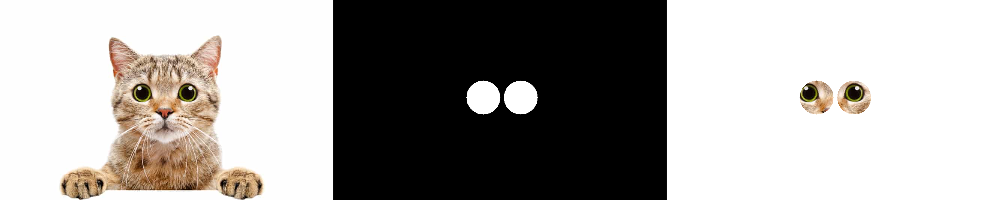

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img = cv.imread('/content/drive/MyDrive/PCVK/Images/kucing.jpg')

# Pastikan gambar terbaca
if img is None:
    print("Error: Gambar tidak ditemukan.")
    exit()

mask = np.zeros(img.shape, dtype=np.uint8)
mask = cv.circle(mask, (400, 260), 45, (255,255,255), -1)

mask2 = np.zeros(img.shape, dtype=np.uint8)
mask2 = cv.circle(mask, (500, 260), 45, (255,255,255), -1)

result = img & mask & mask2
#fungsi dari opencv berikut dapat digunakan
#result = cv.bitwise_and(image, mask)
result[mask==0] = 255

final_frame = cv.hconcat(( img, mask, result))
cv2_imshow(final_frame)

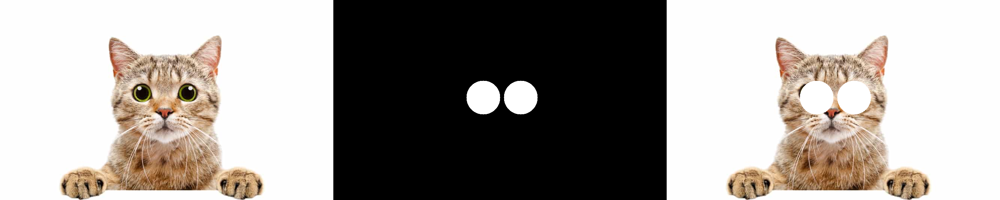

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img = cv.imread('/content/drive/MyDrive/PCVK/Images/kucing.jpg')

# Pastikan gambar terbaca
if img is None:
    print("Error: Gambar tidak ditemukan.")
    exit()

mask = np.zeros(img.shape, dtype=np.uint8)
mask = cv.circle(mask, (400, 260), 45, (255,255,255), -1)
mask = cv.circle(mask, (500, 260), 45, (255,255,255), -1)

result = img | mask
#fungsi dari opencv berikut dapat digunakan
#result = cv.bitwise_and(image, mask)
#result[mask==0] = 255

final_frame = cv.hconcat(( img, mask, result))
cv2_imshow(final_frame)

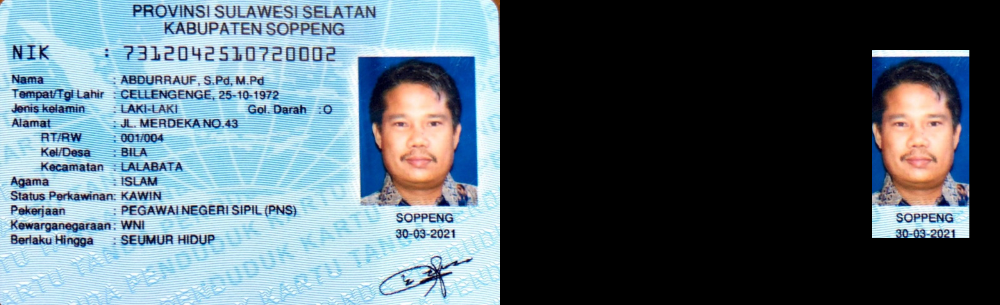

In [56]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP.jpeg')

# Pastikan gambar terbaca
if img is None:
    print("Error: Gambar tidak ditemukan.")
    exit()

mask = np.zeros(img.shape, dtype=np.uint8)
mask = cv.rectangle(mask, (595, 80), (750, 380), (255, 255, 255), -1)
#mask = cv.circle(mask, (500, 260), 45, (255,255,255), -1)

result = img & mask
#fungsi dari opencv berikut dapat digunakan
#result = cv.bitwise_and(image, mask)
#result[mask==0] = 255

final_frame = cv.hconcat(( img,  result))
cv2_imshow(final_frame)

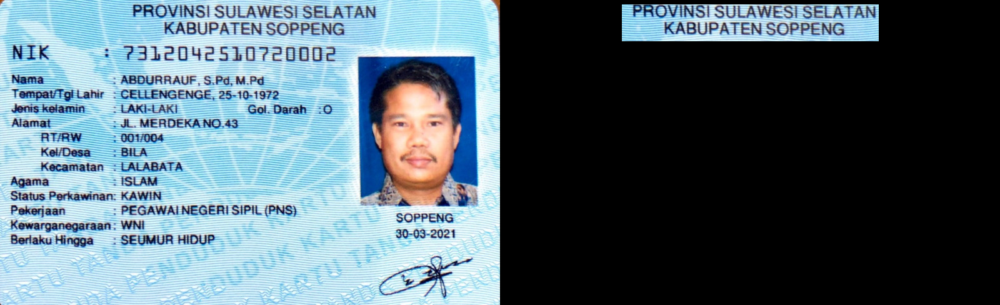

In [63]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP.jpeg')

# Pastikan gambar terbaca
if img is None:
    print("Error: Gambar tidak ditemukan.")
    exit()

mask = np.zeros(img.shape, dtype=np.uint8)
mask = cv.rectangle(mask, (195, 7), (605, 65), (255, 255, 255), -1)
#mask = cv.circle(mask, (500, 260), 45, (255,255,255), -1)

result = img & mask
#fungsi dari opencv berikut dapat digunakan
#result = cv.bitwise_and(image, mask)
#result[mask==0] = 255

final_frame = cv.hconcat(( img,  result))
cv2_imshow(final_frame)